# What is Generic, what is specialized?

We will create a custom nxn matrix that depends on n paramaters, not $n^2$.  What should we be able to inherit from general linear algebra what should be specialized for this custom structure?  Truly good mathematical software thinks carefully about this very question.

In [1]:
using Distributed
addprocs(parse(Int, ENV["SLURM_CPUS_PER_TASK"]));
nworkers()

4

In [2]:
using LinearAlgebra
using DistributedArrays

In [3]:
using CuArrays
using CUDAnative

In [4]:
# # Set device to be used on each worker
gpuworkers = Int[]
asyncmap(collect(zip(workers(), CUDAnative.devices()))) do (p, d)
    push!(gpuworkers, p)
    remotecall_wait(() -> CUDAnative.device!(d), p)
    nothing
end
gpuworkers

4-element Array{Int64,1}:
 2
 3
 4
 5

Let's create a custom nxn matrix that depends on n paramaters, not $n^2$: <br>

C = diag(v) + v*v'

Here M.v will denote the parameters that M depends on. <br>
This is not a sparse matrix, but dense linear algebra clearly does not apply. Good programming is about taking advantage of structure.

# Build a Custom Type

In [5]:
## This would work, but we'll add a few fancy features
## struct Custom
##     v::Vector
## end

In [6]:
struct Custom{T, V} <: AbstractMatrix{T}
     v::V
     Custom(v::V) where V<:AbstractVector{T} where T = new{T, V}(v)
end

We added the type parameter {T} and the subtype AbstractMatrix.  The type parameters says that the vector could be made from any type: Int, Float, BigInt, Quaternion,... <br>

The subtype of AbstractMatrix automatically gives some functionality of size and getindex methods are defined as in the next cell.

In [7]:
Base.size(c::Custom)         =   length(c.v), length(c.v)
Base.getindex(c::Custom,i,j) =   c.v[i]*(i==j)  + c.v[i]*c.v[j]

In [8]:
C = Custom([1,2,3])

3×3 Custom{Int64,Array{Int64,1}}:
 2  2   3
 2  6   6
 3  6  12

In [9]:
cC = Custom(CuArray([1,2,3]))

3×3 Custom{Int64,CuArray{Int64,1}}:
 2  2   3
 2  6   6
 3  6  12

In [10]:
dC = Custom(distribute([1,2,3]))

3×3 Custom{Int64,DArray{Int64,1,Array{Int64,1}}}:
 2  2   3
 2  6   6
 3  6  12

In [11]:
M = Matrix(C)

3×3 Array{Int64,2}:
 2  2   3
 2  6   6
 3  6  12

Notice the different types. C would generally store n numbers, M would store $n^2$ numbers.

In [12]:
C * [1,2,3] # Matrix times vector automatically works though may not be efficient for large n.

3-element Array{Int64,1}:
 15
 32
 51

Why did this automatically work?  The subtyping as an AbstractMatrix and the definition of getindex and size is all that was needed.

In [13]:
# Matrix times vector with O(n) operations (3n multiplications , 2n additions)
Base.:*(c::Custom, x::Vector) = (c.v) .* x + c.v * (c.v'x)

In [14]:
C * [1,2,3] # same answer, now efficient

3-element Array{Int64,1}:
 15
 32
 51

# Compute the largest eigenvalue

Having any matrix times vector (efficient or not), is enough to get the largest singular value = largest eigenvalue using the Arnoldi method from Arpack (the Arnoldi package).

In [15]:
#using Pkg
#Pkg.add("Arpack")
# using Arpack
# svds(C,nsv=1)[1].S

We can also use eigmax defined for Symmetric matrices.

In [16]:
S = Symmetric(M)
eigmax(S)

16.597761867267753

None of these are efficient on this structure.

# Eigmax Efficiently with Newton

With some linear algebra, we can see that $\det(Diag(v)+vv'-λI)=0$ is equivalent to 
$$ f(\lambda) = 1 + \sum_i \frac{v_i^2}{v_i-λ}=0.$$
The largest root $\lambda$ of the above nonlinear equation is the largest eigenvalue.

In [17]:
f(c::Custom)  = λ ->  1 + mapreduce((v) -> v^2 / (v - λ)  , +, c.v)
f′(c::Custom) = λ ->      mapreduce((v) -> v^2 / (v - λ)^2, +, c.v)

f′ (generic function with 1 method)

In [18]:
function LinearAlgebra.eigmax(c::Custom; tol = eps(2.0), debug = false)
    x0 = maximum(c.v) + maximum(c.v)^2
    δ = f(c)(x0)/f′(c)(x0)
    while abs(δ) > x0 * tol               
        x0 -= δ
        δ = f(c)(x0)/f′(c)(x0) # Newton's Method
        debug && println("x = $x0, δ = $δ") # Debugging
    end
    x0
end

The function $f(λ)$ is concave on $(v_\max,\infty)$ and negative on $(v_\max,\lambda_\max)$.
Thus if we start Newton's method on $(v_\max,\lambda_\max)$, we are guaranteed to converge monotonically to the largest eigenvalue.  It is easy to see that $v_\max + v_\max^2$ is in this interval, so it seems like a good place to start the iteration.

# Compare Timings

In [19]:
N = 30_000_000

30000000

In [20]:
v = randn(N);

In [21]:
C = Custom(v);

In [22]:
dC = Custom(distribute(v));

In [42]:
cC = Custom(CuArray(v));

In [24]:
dcC = Custom(DistributedArrays.map_localparts(CuArray, distribute(v, procs = gpuworkers)));

In [25]:
# warmup
eigmax(C);
eigmax(dC);
eigmax(cC);
eigmax(dcC);

In [26]:
@time eigmax(C)

  2.561025 seconds (6 allocations: 192 bytes)


2.9997877016425468e7

In [27]:
@time eigmax(dC)

  1.630216 seconds (25.12 k allocations: 2.629 MiB)


2.9997877016425468e7

In [45]:
CuArrays.@time eigmax(cC)

  0.000256 seconds (206 CPU allocations: 5.969 KiB)


1.5530338678167632

In [29]:
@time eigmax(dcC)

  0.069038 seconds (25.68 k allocations: 2.660 MiB)


2.9997877016425468e7

In [30]:
N*sizeof(Float64) / 1024^2 # MB

228.8818359375

In [31]:
M = length(gpuworkers) * 30 * N

3600000000

In [32]:
M*sizeof(Float64) / 1024^3 # GB

26.82209014892578

In [48]:
;nvidia-smi

Wed Sep 26 12:09:30 2018       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 396.37                 Driver Version: 396.37                    |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  On   | 00000000:04:00.0 Off |                    0 |
| N/A   44C    P0    60W / 300W |   8785MiB / 16160MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
|   1  Tesla V100-SXM2...  On   | 00000000:06:00.0 Off |                    0 |
| N/A   40C    P0    57W / 300W |   8785MiB / 16160MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
|   2  T

In [53]:
dcC = nothing
dcv = nothing
cC = nothing
GC.gc()

In [54]:
dcv = DArray((M,)) do I
    CuArrays.CURAND.curand(Float64, map(length, I)...)
end;

In [55]:
@time eigmax(Custom(dcv))

  1.775626 seconds (34.83 k allocations: 3.609 MiB, 0.61% gc time)


1.2000141109567091e9

In [56]:
;nvidia-smi

Wed Sep 26 12:10:22 2018       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 396.37                 Driver Version: 396.37                    |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  On   | 00000000:04:00.0 Off |                    0 |
| N/A   45C    P0    69W / 300W |   8721MiB / 16160MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
|   1  Tesla V100-SXM2...  On   | 00000000:06:00.0 Off |                    0 |
| N/A   41C    P0    68W / 300W |   8721MiB / 16160MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
|   2  T

# A Closer Look at Newton

In [36]:
eigmax(C, debug=true)

x = 63.82223416753675, δ = -63.72823592945494
x = 127.55047009699169, δ = -127.50304508539955
x = 255.05351518239124, δ = -255.02797671448198
x = 510.0814918968732, δ = -510.0612078779493
x = 1020.1426997748225, δ = -1020.1022769799122
x = 2040.2449767547346, δ = -2040.103423019552
x = 4080.348399774287, δ = -4079.792065143243
x = 8160.140464917529, δ = -8157.920125810244
x = 16318.060590727773, δ = -16309.183774334017
x = 32627.24436506179, δ = -32591.757250025603
x = 65219.00161508739, δ = -65077.20769878447
x = 130296.20931387186, δ = -129730.26596111919
x = 260026.47527499107, δ = -257772.52363404856
x = 517798.99890903966, δ = -508861.1731043042
x = 1.0266601720133438e6, δ = -991523.3153547678
x = 2.0181834873681115e6, δ = -1.882405059360047e6
x = 3.9005885467281584e6, δ = -3.393399621352411e6
x = 7.293988168080569e6, δ = -5.520453882156974e6
x = 1.2814442050237544e7, δ = -7.340390504272523e6
x = 2.015483255451007e7, δ = -6.613298429364079e6
x = 2.6768130983874146e7, δ = -2.882012

2.9997877016425468e7

In [37]:
using Plots
pyplot()

Plots.PyPlotBackend()

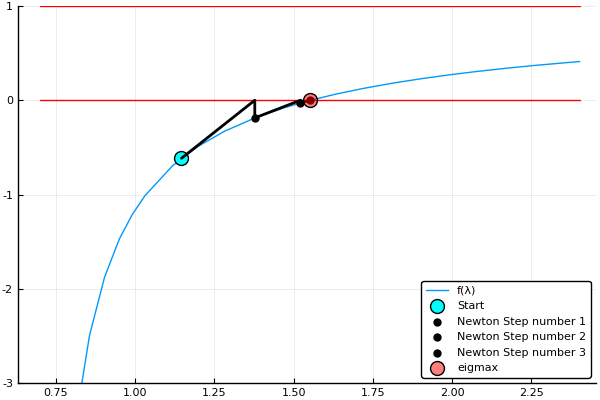

In [38]:
n=5
v = randn(n)
C = Custom(v)

xmin = maximum(v)
xmax = 2*eigmax(C) - xmin

plot(f(C),xmin,xmax, ylim=(-3,1), label="f(λ)")
plot!(x->0,xmin,xmax,color=:red, label="")
plot!(x->1,xmin,xmax, color=:red, label="")


x = xmin + xmin^2 
scatter!([x],[f(C)(x)],color=:cyan, label="Start", markersize=10)
for k=1:3
    xold = x
    x -= f(C)(x)/f′(C)(x) 
    plot!([xold,  x, x],[f(C)(xold), 0, f(C)(x)],width=2,color=:black,label="")
    scatter!([x],[f(C)(x)],color=:black,markersize=5,label="Newton Step number $k")
end
scatter!([eigmax(C)],[0.0],color=:red,markersize=10,label="eigmax",alpha=.5)